In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Tuesday Jan 30 17:27:07 2024

@author: Ruth Mvula

"""

In [1]:
import pandas as pd
import numpy as np
import random
import os
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeRegressor
import datetime
from collections import Counter
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [24]:
df = pd.read_csv('simulated_failure_data.csv')
df.drop(['Component_ID'], axis=1, inplace=True)


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 104300 entries, 0 to 104299
Data columns (total 20 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Date                       104300 non-null  object 
 1   Component                  104300 non-null  object 
 2   Component_Age              104300 non-null  int64  
 3   Traffic_Load_Train_Size    104300 non-null  object 
 4   Traffic_Load_Coach_Number  104300 non-null  int64  
 5   Traffic_Load_Acceleration  104300 non-null  float64
 6   Traffic_Load_Speed         104300 non-null  int64  
 7   Traffic_Load_Train_Type    104300 non-null  object 
 8   Traffic_Load_Total_Weight  104300 non-null  int64  
 9   Track_Geometry_Length      104300 non-null  int64  
 10  Track_Geometry_Width       104300 non-null  float64
 11  Track_Geometry_Curvature   104300 non-null  float64
 12  Track_Geometry_Gradient    104300 non-null  float64
 13  Weather_Air_Temperature    10

In [26]:
Counter(df.Failure)

Counter({False: 71237, True: 33063})

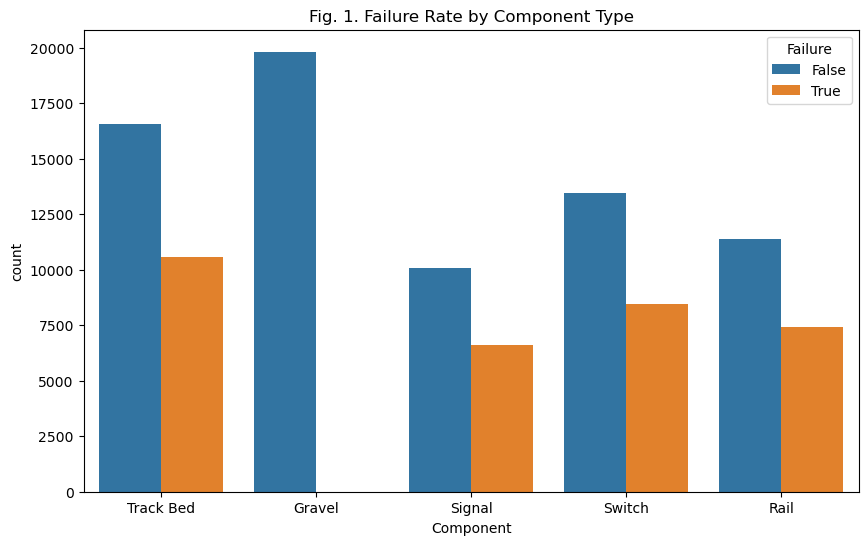

In [27]:

# Failure Rate by Component Type
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Component', hue='Failure')
plt.title('Fig. 1. Failure Rate by Component Type')
plt.show()


In [28]:
df['Date'] = pd.to_datetime(df['Date'])
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day
df['Weekday'] = df['Date'].dt.weekday
df.drop(['Date'], axis=1, inplace=True)


In [29]:
# Initialize LabelEncoders
le_component = LabelEncoder()
le_train_size = LabelEncoder()
le_train_type = LabelEncoder()
le_weather_snow = LabelEncoder()

# Encode each column
df['Component'] = le_component.fit_transform(df['Component'])
df['Traffic_Load_Train_Size'] = le_train_size.fit_transform(df['Traffic_Load_Train_Size'])
df['Traffic_Load_Train_Type'] = le_train_type.fit_transform(df['Traffic_Load_Train_Type'])
df['Weather_Snow'] = le_weather_snow.fit_transform(df['Weather_Snow'])


In [7]:
df.describe().transpose()


,count,mean,std,min,25%,50%,75%,max
Component,104300.0,2.170000,1.470075,0.000000,1.000000,2.000000,4.000000,4.000000
Component_Age,104300.0,909.298878,527.044320,0.000000,455.000000,910.000000,1365.000000,1824.000000
Traffic_Load_Train_Size,104300.0,0.996711,0.815987,0.000000,0.000000,1.000000,2.000000,2.000000
Traffic_Load_Coach_Number,104300.0,9.487114,2.867502,5.000000,7.000000,9.000000,12.000000,14.000000
Traffic_Load_Acceleration,104300.0,1.400015,0.519612,0.500004,0.949837,1.399951,1.850426,2.299949
Traffic_Load_Speed,104300.0,139.623241,51.989372,50.000000,95.000000,139.000000,185.000000,229.000000
Traffic_Load_Train_Type,104300.0,0.999262,0.817296,0.000000,0.000000,1.000000,2.000000,2.000000
Traffic_Load_Total_Weight,104300.0,1251.274525,434.086504,500.000000,875.000000,1252.000000,1628.000000,1999.000000
Track_Geometry_Length,104300.0,1249.654190,433.034613,500.000000,876.000000,1249.000000,1623.000000,1999.000000
Track_Geometry_Width,104300.0,1.550099,0.086667,1.400002,1.475070,1.550205,1.624974,1.699998


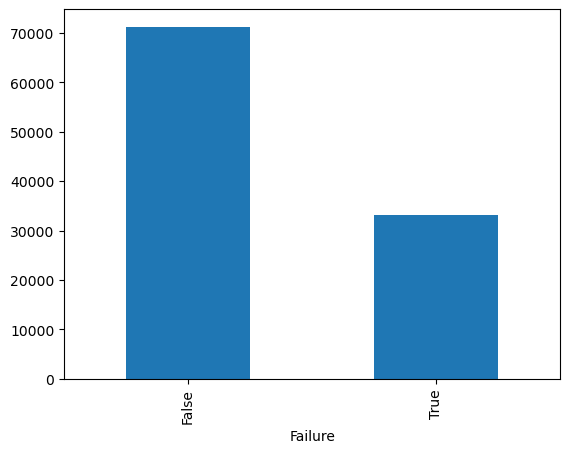

In [8]:
df['Failure'].value_counts().plot(kind='bar')
plt.show()


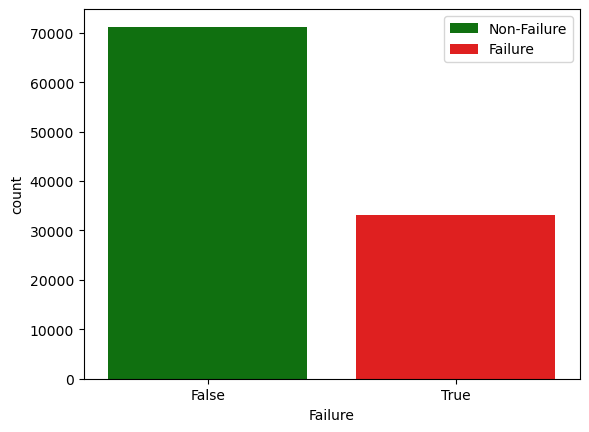

In [17]:
# Define the color mapping
palette_colors = {True: 'red', False: 'green'}

# Create the countplot
ax = sns.countplot(data=df, x='Failure', hue='Failure', palette=palette_colors)

# Adjust the legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles, labels=['Non-Failure', 'Failure'])

# Show the plot
plt.show()

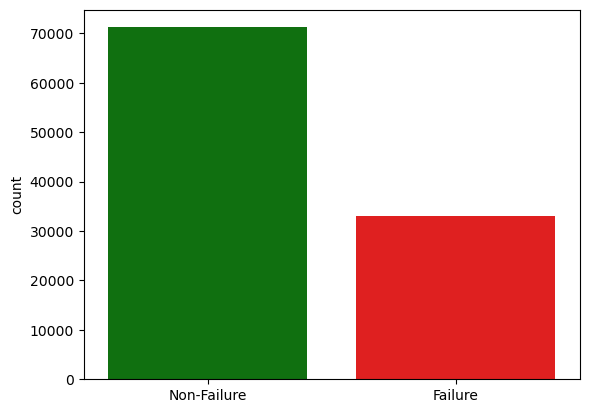

In [22]:
# Replace True/False with 'Failure'/'Non-Failure'
# df["Failure"] = df["Failure"].map({True: "Failure", False: "Non-Failure"})
palette_colors = {"Failure": "red", "Non-Failure": "green"}
# Create the countplot
sns.countplot(data=df, x="Failure", hue="Failure", palette=palette_colors)

# Remove the x-axis label
plt.xlabel("")

# Add a title
# plt.title("Fig. 5. Data Repartition (Failure vs Non-Failure)")

plt.show()

In [9]:
X = df.drop(['Failure',], axis=1)
y = df['Failure']

y = LabelEncoder().fit_transform(y)

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3333, random_state=42)


In [10]:
# Standardizing the features
scaler = StandardScaler()
scaled_data = scaler.fit_transform(X)

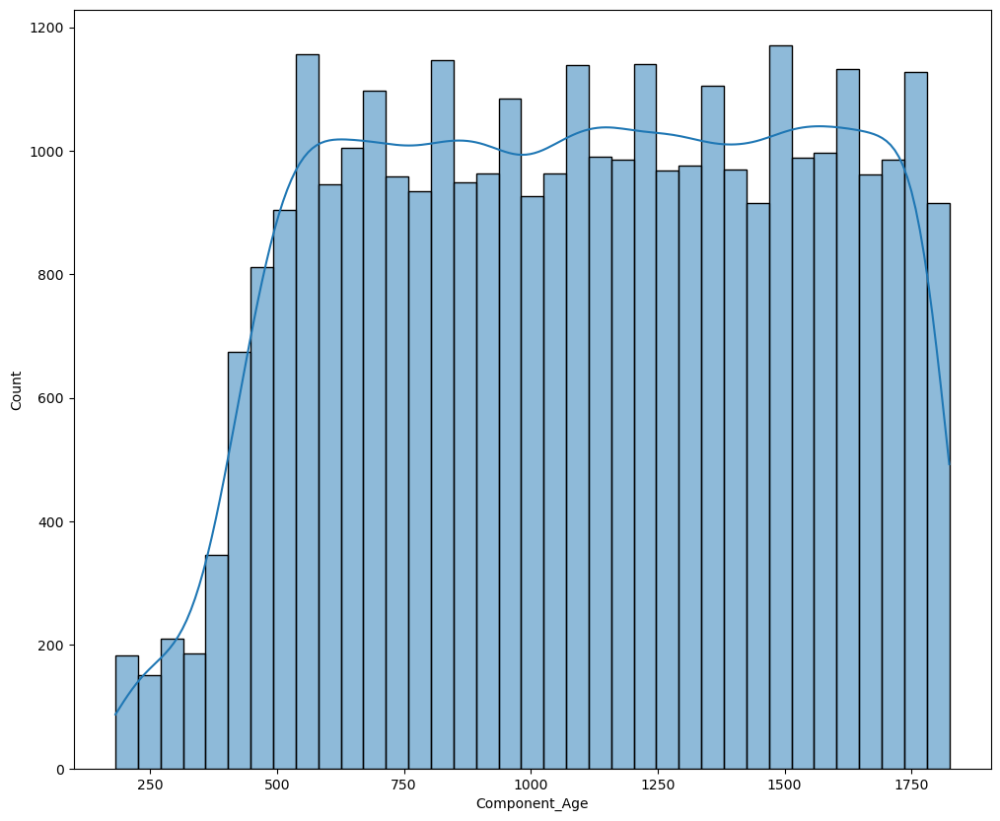

In [30]:

# Component Age at Failure
plt.figure(figsize=(12, 10))
sns.histplot(data=df[df['Failure']], x='Component_Age', kde=True)
# plt.title('Fig. 3. Component Age (in days) at Failure')
plt.show()


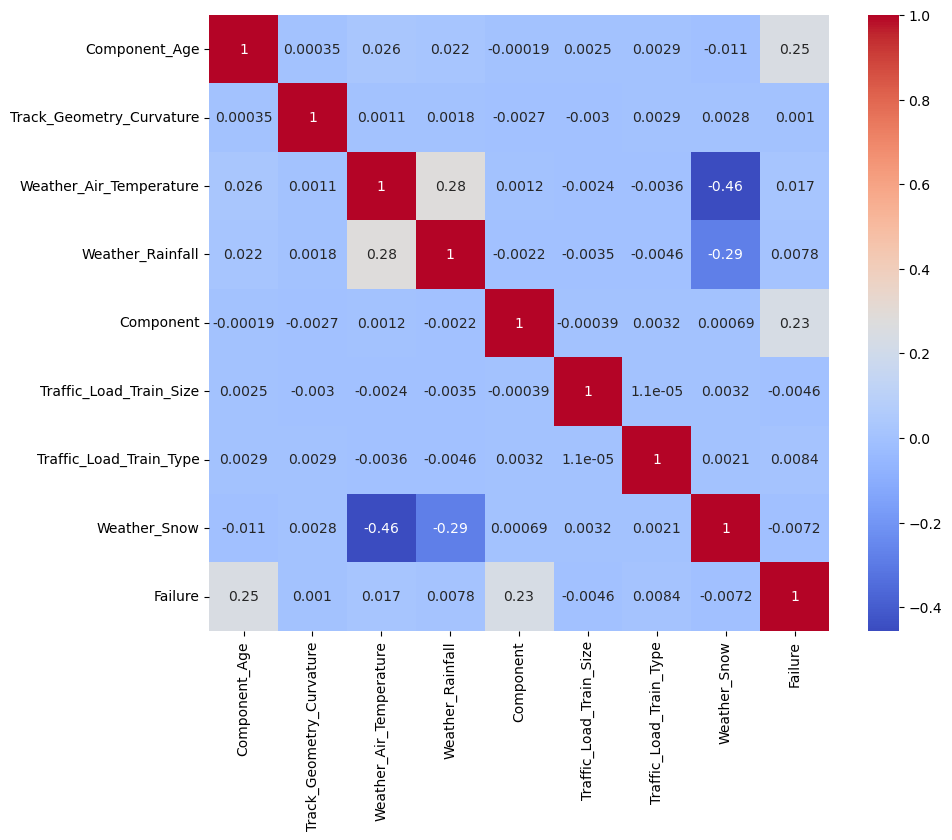

In [31]:



# Correlation Heatmap
plt.figure(figsize=(10, 8))
# correlation_matrix = df[['Weather_Air_Temperature', 'Weather_Relative_Humidity', 'Traffic_Load_Speed', 'Track_Geometry_Curvature', 'Weather_Snow_Yes','Weather_Snow_No', 'Failure']].corr()
correlation_matrix = df[["Component_Age", "Track_Geometry_Curvature", "Weather_Air_Temperature", "Weather_Rainfall", "Component", "Traffic_Load_Train_Size", "Traffic_Load_Train_Type", "Weather_Snow", "Failure"]].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
# plt.title('Fig. 2. Correlation Heatmap')
plt.show()


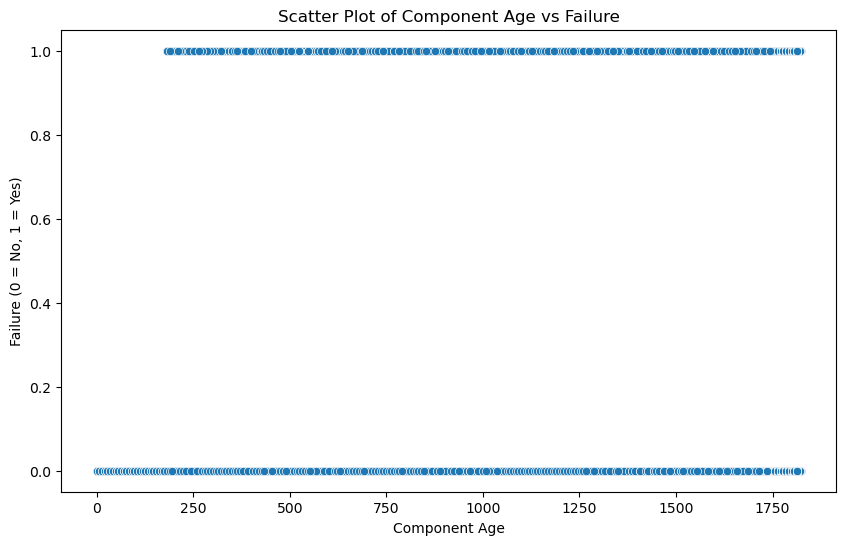

In [13]:
# Assuming your dataframe is named 'df'
# Convert 'Failure' from boolean to integer for plotting
df['Failure'] = df['Failure'].astype(int)

# Plot 'Component_Age' vs 'Failure'
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Component_Age', y='Failure', data=df)
plt.title('Scatter Plot of Component Age vs Failure')
plt.xlabel('Component Age')
plt.ylabel('Failure (0 = No, 1 = Yes)')
plt.show()


In [15]:

# Time Series Analysis of Failures
plt.figure(figsize=(12, 6))
df.set_index('Year')['Failure'].resample('M').mean().plot()  # Monthly failure rate
plt.title('Fig. 4. Time Series Analysis of Failures')
plt.ylabel('Failure Rate')
plt.show()


TypeError: Only valid with DatetimeIndex, TimedeltaIndex or PeriodIndex, but got an instance of 'Index'

<Figure size 1200x600 with 0 Axes>

In [17]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

In [18]:
features = X
failure = y

# Apply PCA and reduce the data to two dimensions for visualization
pca = PCA(n_components=2)
principal_components = pca.fit_transform(features)


In [16]:
import plotly.express as px
from sklearn.manifold import TSNE

In [59]:

# Assuming 'df' is your DataFrame and it has been preprocessed accordingly
# Let's also assume you've applied PCA and have three principal components for the sake of 3D visualization

# Apply PCA and reduce the data to three dimensions for visualization
pca = PCA(n_components=3)
principal_components = pca.fit_transform(features)

# Create a DataFrame with the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3'])
pca_df['Failure'] = failure

# Create the interactive 3D scatter plot
fig = px.scatter_3d(pca_df, x='PC1', y='PC2', z='PC3', color='Failure')
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))

# Show the plot
fig.show()


In [19]:

# Assuming 'df' is your DataFrame and it has been preprocessed accordingly
# Select your features for t-SNE, excluding non-numerical columns and the target variable
# Apply t-SNE to reduce the data to three dimensions for visualization
tsne = TSNE(n_components=3, n_iter=300)
tsne_results = tsne.fit_transform(features)


In [20]:

# Create a DataFrame with the t-SNE results
tsne_df = pd.DataFrame(data=tsne_results, columns=['TSNE1', 'TSNE2', 'TSNE3'])
tsne_df['Failure'] = failure


In [21]:

# Create the interactive 3D scatter plot using plotly
fig = px.scatter_3d(tsne_df, x='TSNE1', y='TSNE2', z='TSNE3', color='Failure')
# fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))

# Show the plot
# fig.show()


In [22]:
import plotly.graph_objects as go
import plotly.express as px
from sklearn.manifold import TSNE
import pandas as pd
import os

In [23]:
angles = range(0, 360, 80)  # Example angles
for angle in angles:
    fig.update_layout(scene_camera=dict(eye=dict(x=np.cos(angle), y=np.sin(angle), z=0.5)))
    fig.write_image(f"frame_{angle}.png")

In [ ]:
import PIL.Image
import io
import plotly.express as px

# Generate your animated plot.
plot = px.bar(data_frame=features, x=your_x, y=your_y, animation_frame=your_af)

# Save each plot frame to a list that is used to generate the .gif file. 
frames = []
for slider_pos, frame in enumerate(plot.frames):
    plot.update(data=frame.data)
    plot.layout.sliders[0].update(active=slider_pos)
    frames.append(PIL.Image.open(io.BytesIO(plot.to_image(format="png"))))
    
# Create the gif file.
frames[0].save("out_dir",
               save_all=True,
               append_images=frames[1:],
               optimize=True,
               duration=1000,
               loop=0)

In [ ]:
import plotly.graph_objs as go
from plotly_gif import GIF, three_d_scatter_rotate

In [ ]:
fig = go.Figure()
# add your traces()
# add your formatting()

gif = GIF()
three_d_scatter_rotate(gif, fig)